In [ ]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
import matplotlib.pyplot as plt
from torchvision import transforms as T
import torch
from ultralytics import YOLO

: 

Change Working Directory

In [ ]:
import os
print("Current working directory:", os.getcwd())
os.chdir(r"D:\Labmentix\Aerial-Object-Detection-Bird-vs-Drone")
print("Now in:", os.getcwd())

## 1. Data Analysis

Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



<ipython-input-1-5ddb546dea18>:123: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(cls_names, rotation = 90)


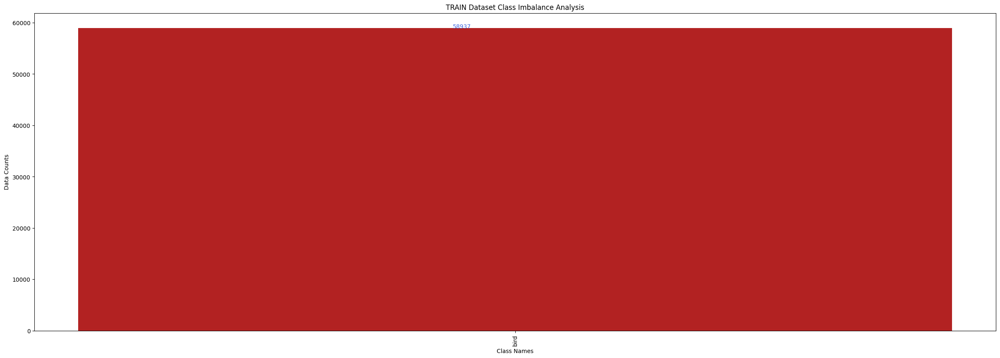

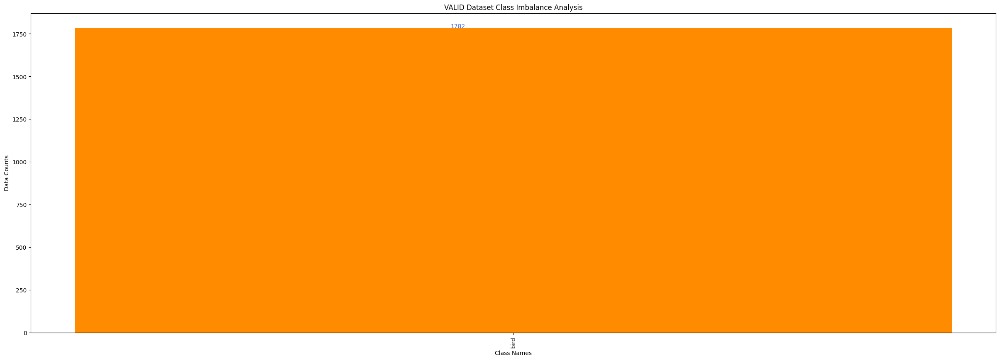

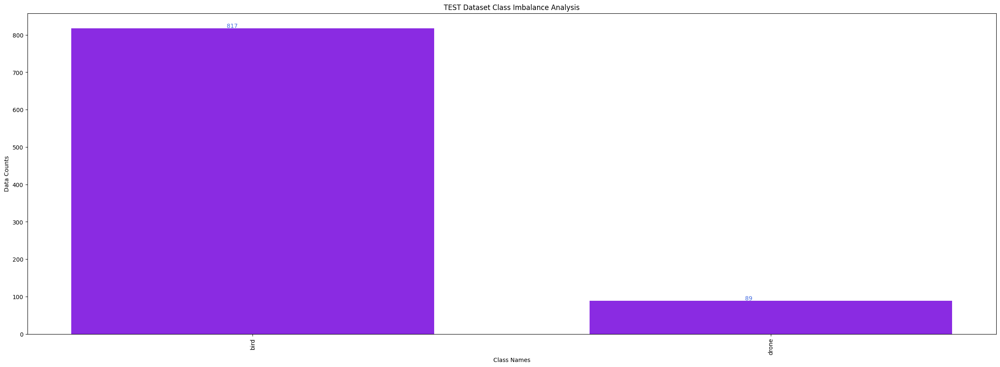

In [ ]:
class Visualization:

    def __init__(self, root, data_types, n_ims, rows, cmap = None, data_yaml = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]
        self.data_yaml = data_yaml
        
        self.create_yaml(); self.get_cls_names(); self.get_bboxes()        
                
    def create_yaml(self):

        data = {}
        data['names'] = ["bird", "drone"]
        data['train'] = f'{root}/train'
        data['val'] = f'{root}/valid'
        data['test']  = f'{root}/test'        
        
        # Save the updated YAML content to a file        
        with open(self.data_yaml, 'w') as file: yaml.dump(data, file, default_flow_style=False)        
    
    def get_cls_names(self):

        with open(self.data_yaml, 'r') as file: data = yaml.safe_load(file)      
        # Extract class names
        class_names = data['names']        
        
        # Create a dictionary with index as key and class name as value
        self.class_dict = {index: name for index, name in enumerate(class_names)}        
    
    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{root}/{data_type}/images/*")
            
            for idx, im_path in enumerate(im_paths):
                # if idx == 10: break                
                bboxes = []
                im_ext = os.path.splitext(im_path)[-1]
                lbl_path = im_path.replace(im_ext, ".txt")
                lbl_path  = lbl_path.replace(f"{data_type}/images", f"{data_type}/labels")
                if not os.path.isfile(lbl_path): continue                
                meta_data = open(lbl_path).readlines()

                for data in meta_data:                    
                    # Split the string by space and strip the newline character
                    # Change here 
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    # Convert first element to integer and the rest to float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)
                    
            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths
    
    def plot(self, rows, cols, count, im_path, bboxes):
    
        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:
            
            class_id, x_center, y_center, w, h = bbox

            # Convert YOLO format to pixel values
            x_min = int((x_center - w / 2) * width)  # x_min
            y_min = int((y_center - h / 2) * height)  # y_min
            x_max = int((x_center + w / 2) * width)  # x_max
            y_max = int((y_center + h / 2) * height)  # y_max
            
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There is (are) {len(bboxes)} object(s) in the image.")
        
        return count + 1

    def vis(self, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1
        
        plt.figure(figsize = (25, 20))
                
        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):
        
            if count == self.n_ims + 1: break           
            
            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)
            
        plt.show()

    def data_analysis(self, save_name, color):

        print("Data analysis is in process...\n")
        
        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())
        
        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names, rotation = 90)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")
    
    def visualization(self): [self.vis(save_name) for save_name in self.data_types]
        
    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]
        
root = "/kaggle/input/bird-vs-drone/Dataset"
data_yaml = "/kaggle/working/data.yml"
vis = Visualization(root = root, data_types = ["train", "valid", "test"], n_ims = 20, rows = 5, cmap = "rgb", data_yaml = data_yaml)
vis.analysis()

### 2. Data Visualization

TRAIN Data Visualization is in process...



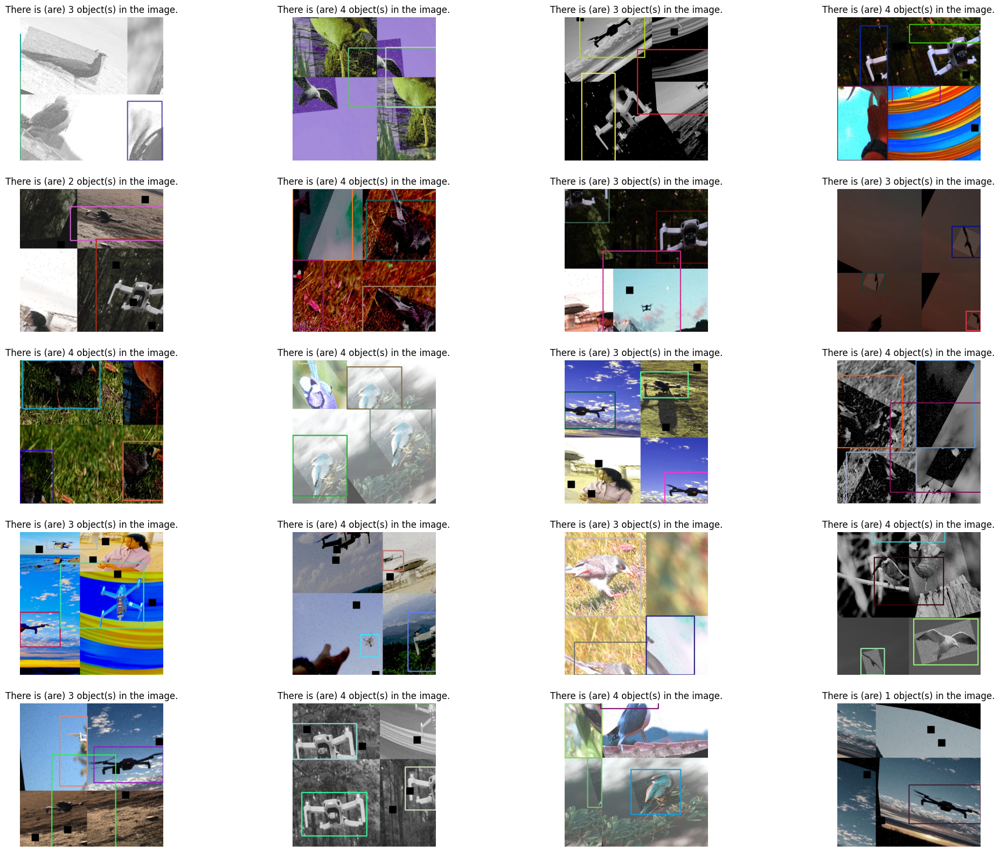

VALID Data Visualization is in process...



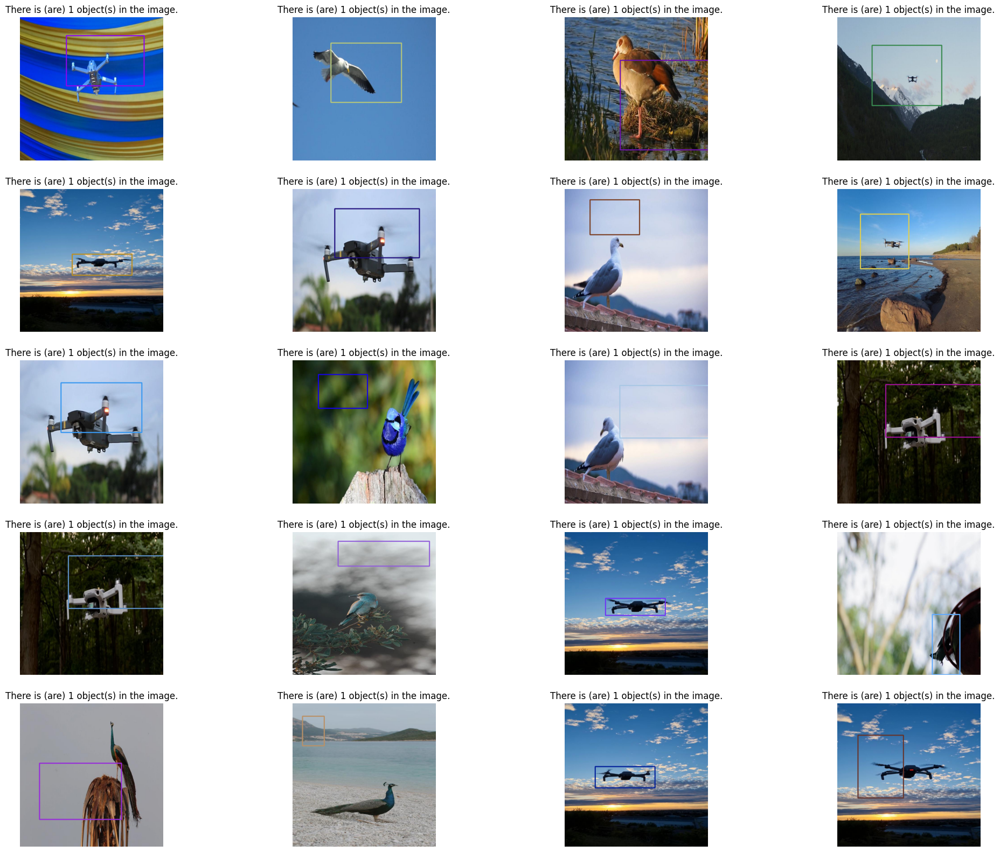

TEST Data Visualization is in process...



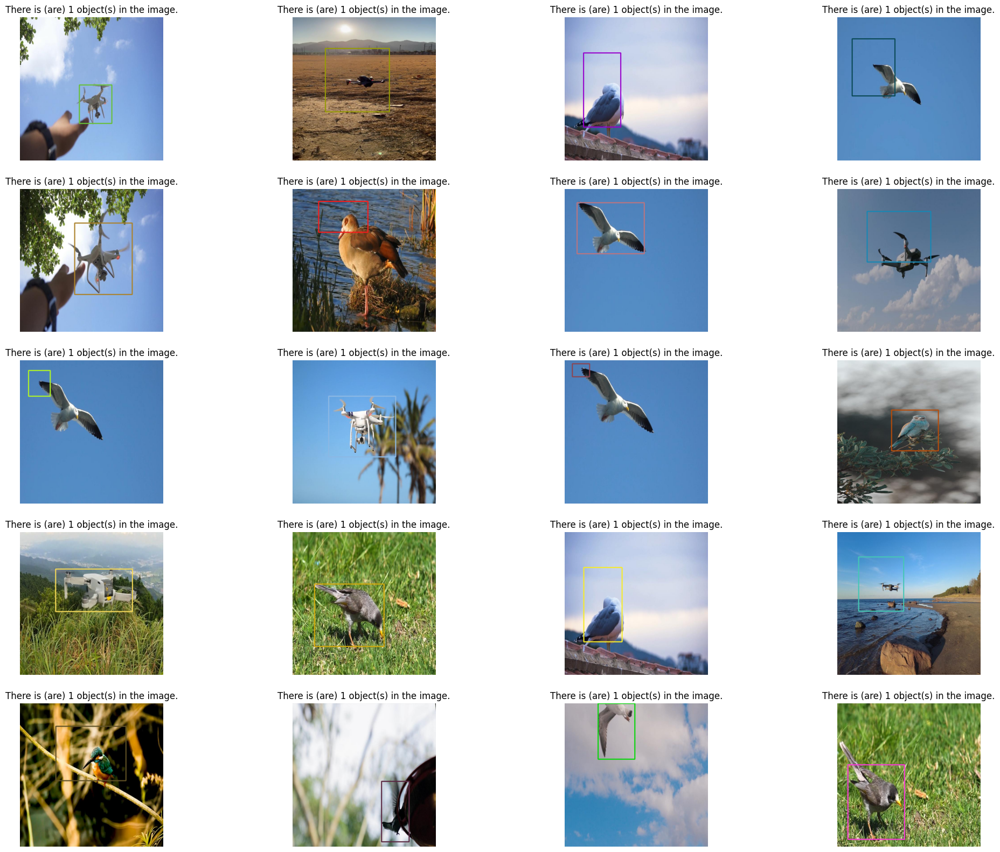

In [2]:
vis.visualization()

### 3. Train AI Model 

In [ ]:
class YOLOv11Trainer:
    def __init__(self, model_path, data_yaml, device):
        """
        Initializes the YOLOv5 model for training.

        Args:
            model_path (str): Path to the YOLO model weights (e.g., 'yolov5n.pt' or custom pretrained weights).
            data_yaml (str): Path to the YOLO `data.yaml` file.
            device (str or list): Device(s) to train on (e.g., 'cuda:0', [0,1], or 'cpu').
        """
        self.device = device if torch.cuda.is_available() else "cpu"
        self.model = YOLO(model_path)
        self.data_yaml = data_yaml

    def train(self, epochs=1, imgsz=480):
        """
        Trains the YOLO model.

        Args:
            epochs (int): Number of training epochs.
            imgsz (int): Training image size.
        """
        train_results = self.model.train(
            data=self.data_yaml,
            epochs=epochs,
            imgsz=imgsz,
            device=self.device
        )
        return self.model

trainer = YOLOv11Trainer(model_path="yolo11n.pt", data_yaml=data_yaml, device=[0,1])
model = trainer.train(epochs=10, imgsz=480)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 14.3 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 72.3MB/s]


Ultralytics 8.3.78 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
                                                       CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/data.yml, epochs=10, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=[0, 1], workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fa

100%|██████████| 755k/755k [00:00<00:00, 16.0MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

### 4. Learning Curves

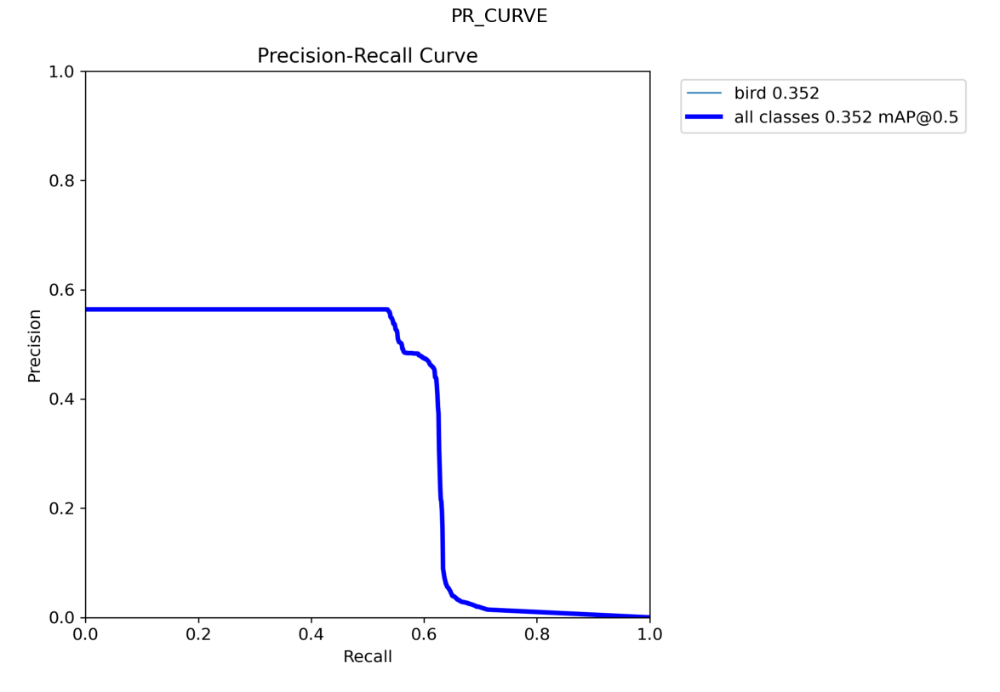

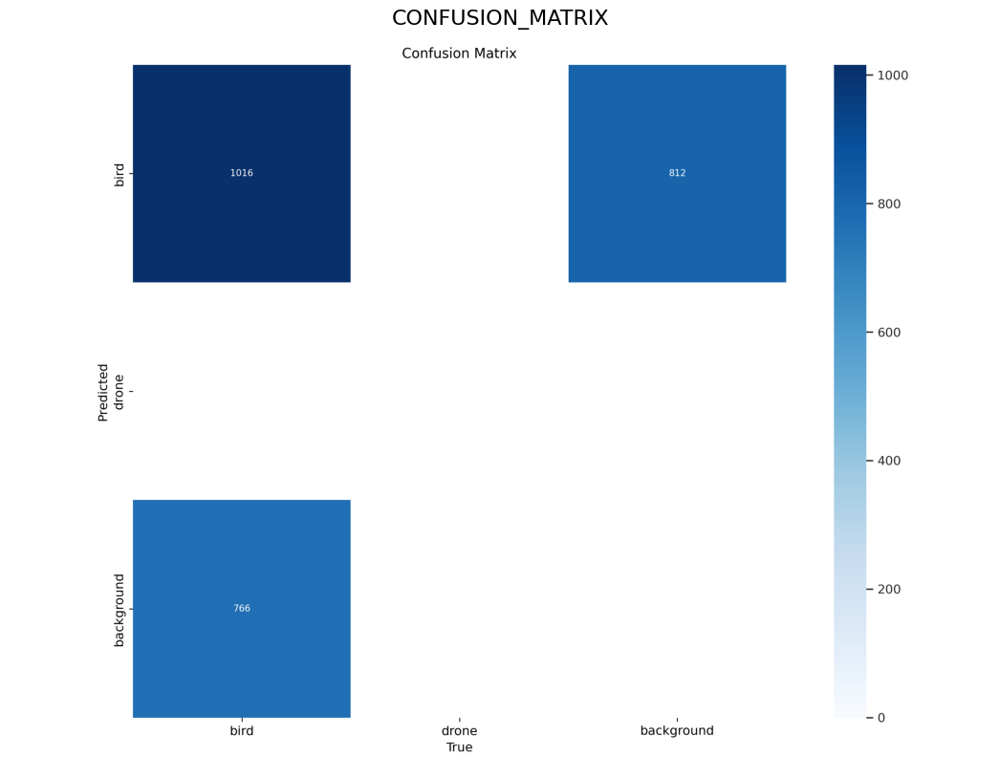

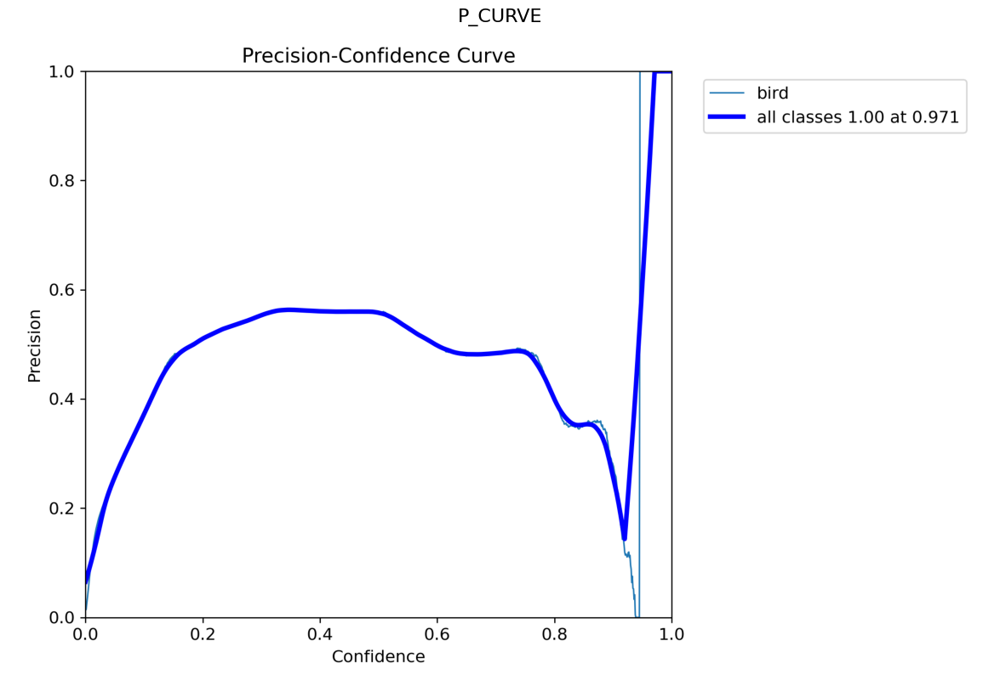

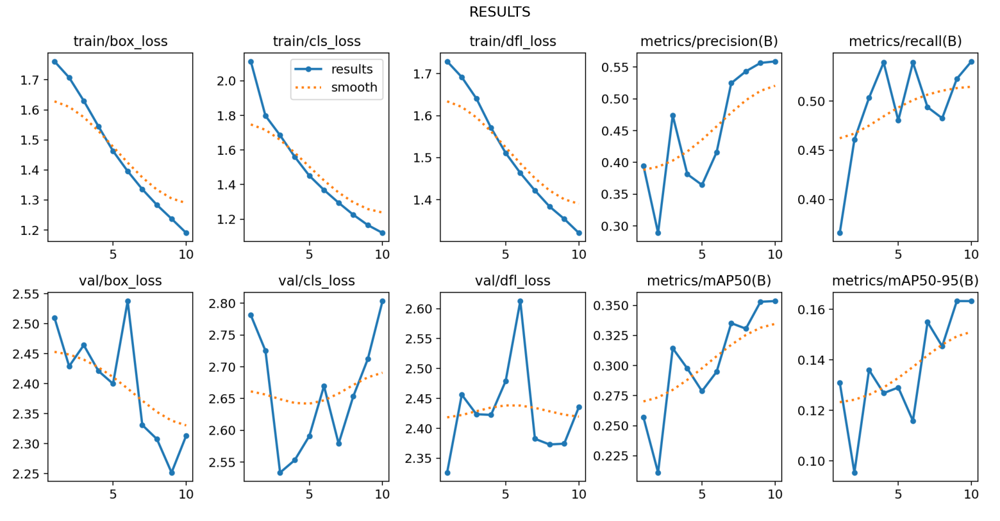

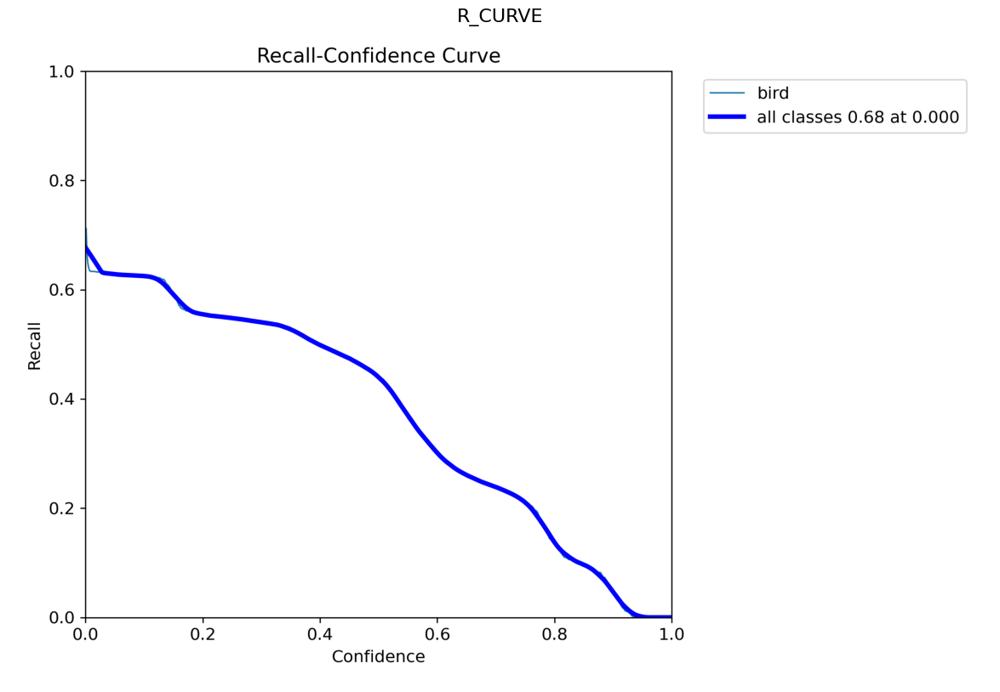

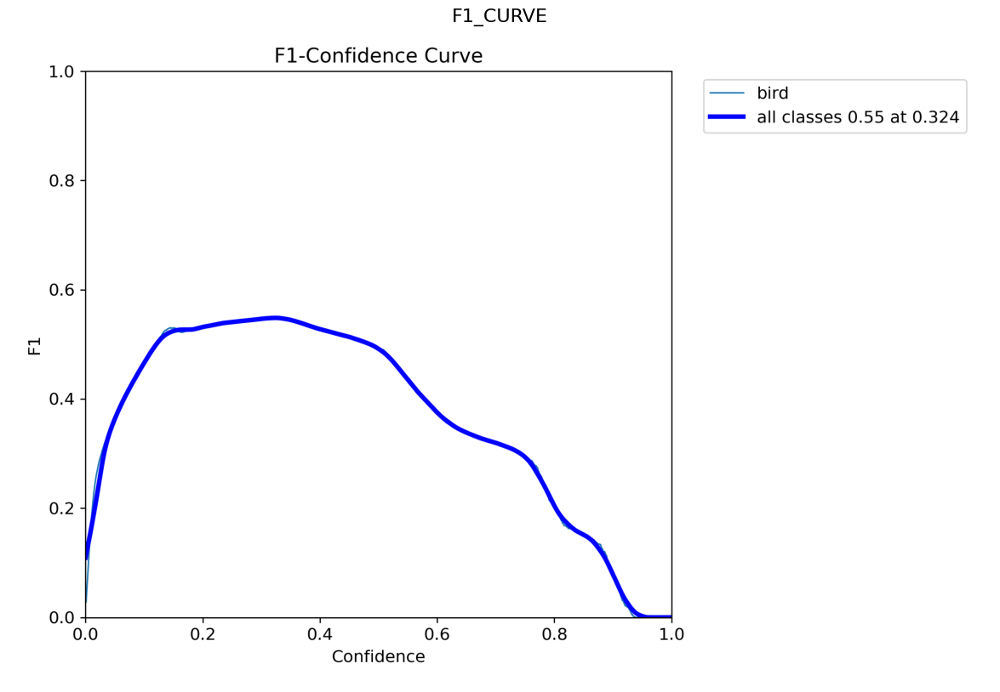

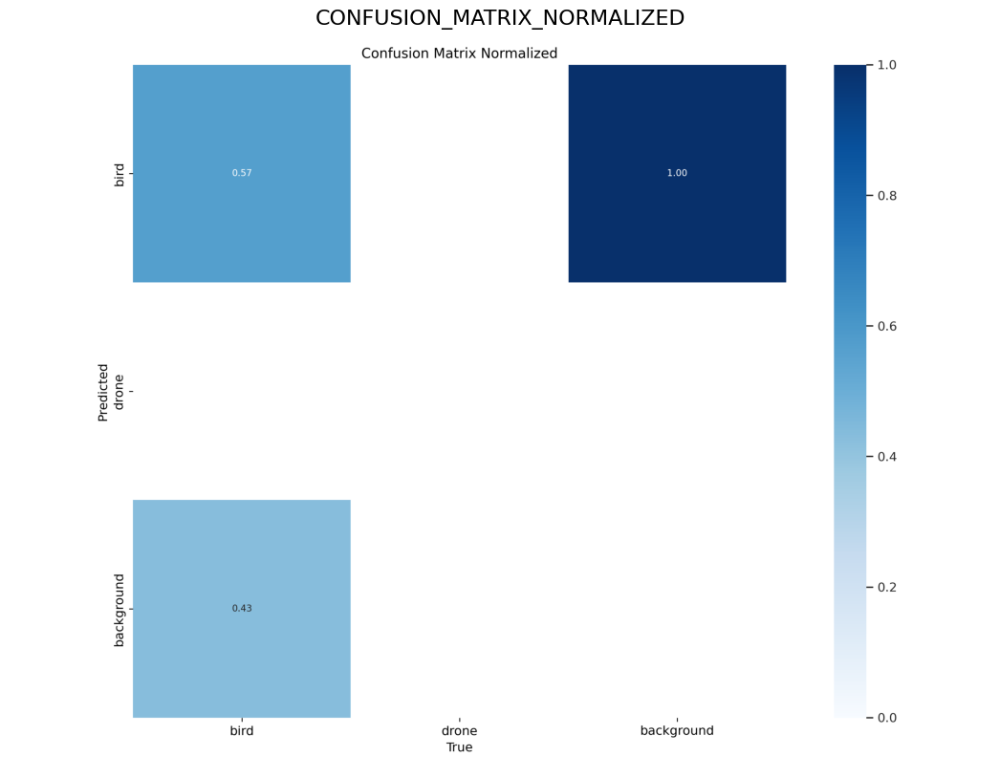

In [ ]:
class YOLOVisualizer:
    def __init__(self, vis_dir):
        """
        Initializes the YOLO visualizer.

        Args:
            vis_dir (str): Path to the directory containing YOLO-generated result images.
        """
        self.vis_dir = vis_dir

    def visualize(self):
        """
        Displays each YOLO-generated result image in a separate window.
        """
        vis_files = glob(f"{self.vis_dir}/*.png")

        if not vis_files:
            print("No images found in the directory.")
            return

        for idx, vis_file in enumerate(vis_files):            
            title = os.path.splitext(os.path.basename(vis_file))[0]            
            img = Image.open(vis_file)
            plt.figure(figsize=(20, 10))  
            plt.imshow(img)
            plt.axis("off")
            plt.title(f"{title.upper()}", fontsize = 16)
            plt.show()

visualizer = YOLOVisualizer(vis_dir="runs/detect/train/")
visualizer.visualize()

### 5. Inference with Test Dataset

Inference process started...


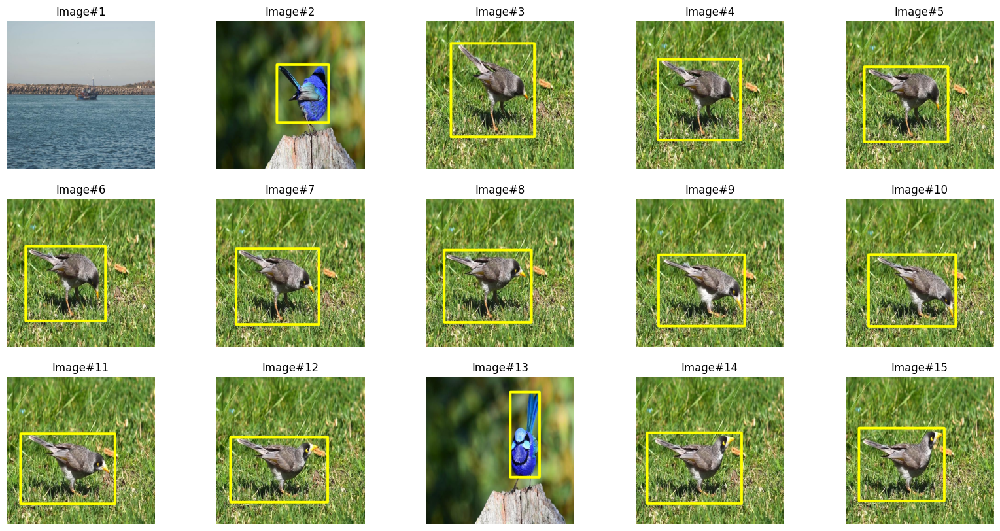

In [5]:
class YOLOv11Inference:
    def __init__(self, model, device="cuda"):
        """
        Initializes the YOLOv5 model for inference.

        Args:
            model_path (str): Path to the trained YOLOv5 model (e.g., 'best.pt').
            device (str): Device to run inference on ('cuda:0' or 'cpu').
        """
        self.device = device
        self.model = model.to(self.device)

    def run(self, image_dir, n_ims=15, rows=3):
        """
        Runs inference on images in a specified directory and visualizes the results.

        Args:
            image_dir (str): Path to the directory containing images.
            n_ims (int): Number of images to visualize.
            rows (int): Number of rows in the visualization grid.
        """
        # Run inference
        print("Inference process started...")
        inference_results = self.model(image_dir, device=self.device, verbose=False)
        
        # Visualize results
        self._inference_vis(inference_results, n_ims, rows)

    def _inference_vis(self, res, n_ims, rows):
        """
        Visualizes inference results with bounding boxes.

        Args:
            res (list): Inference results from the YOLO model.
            n_ims (int): Number of images to visualize.
            rows (int): Number of rows in the visualization grid.
        """
        cols = n_ims // rows
        plt.figure(figsize=(20, 10))

        for idx, r in enumerate(res):
            if idx == n_ims:
                break

            plt.subplot(rows, cols, idx + 1)
            or_im_rgb = np.array(Image.open(r.path).convert("RGB"))

            for i in r:
                for bbox in i.boxes:
                    box = bbox.xyxy[0]
                    x1, y1, x2, y2 = box
                    coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                    cv2.rectangle(or_im_rgb, coord1, coord2, color=(255, 255, 0), thickness=10)

            plt.imshow(or_im_rgb)
            plt.title(f"Image#{idx + 1}")
            plt.axis("off")

        plt.show()

yolo_infer = YOLOv11Inference(model)
yolo_infer.run(image_dir = f"{root}/test/images")